###  <span style="color:red">**This Notebook can be run from Google Colab:**</span>

https://colab.research.google.com

# **<span style="color:red">Background:</span>**

#### First, we trained a model using positive patches only (only patches actually containing regions corresponding to growing bacterial colonies in the petri-dish), to specifically differentiate among the 8 bacterial species in our dataset. From the confusion matrix of that model, we could see that the model was having difficulty to differentiate between classes 'C1' and 'C2-3' and between classes 'C4-7' and 'C5', even for the images on which the model was trained (except if overfitted).<br>

#### As a next step, we then trained a model to specifically learn to differentiate 'C1' vs 'C2-3' vs 'all_other' classes. This is a model with 3 classes only.<br>

#### Similarly, we also trained a model to specifically learn to differentiate 'C4-7' vs 'C5' vs 'all_other' classes.<br>

#### We also trained a model just to differentiate between positive bacterial colony patches (of any class) and negative patches (either petri-dish solid media background, petri-dish border or white image background). For this, we just combined all positive training patches (regardless of the bacterial species) in a single 'positive' class and all negative training patches in a single 'negative' class.<br> 

#### We then had 4 models, the first one producing 8 predicted probabilities (one for each bateria species), the second one producing 3 predicted probabilities ('C1','C2-3','all_other'), the third one also producing 3 predicted probabilities ('C4-7','C5','all_other') and the fourth one producing 2 predicted probabilities (positive_patch, negative_patch), for a total of 16 predicted probabilities.<br>

#### With those 4 models, using an augmented training dataset with 9 classes (8 bacterial species + negative_patches), we combined the 16 predicted probabilities as features and the ground true, into a training dataset which we used to use to cross validate Logistic Regression, SVM and Random-Forest models, trained to learn to predict either negative or the correct bacterial species, from the probabilities produced by the 4 models above Here we got better results with a Random Forest model. We then calibrated this Random Forest model so that the output for each class can be directly interpreted as a confidence level or the probability of such class being present.<br> 

#### **Here, for each test image, we will now create heatmaps of predicted probabilities. For this, we will generate overlapping patches for each image then we will use our final model to predict the class probabilities for each patch. Since we have overlapping patches, each region within the image will be contained in more than one patch, so we will use simple voting to create a heatmap of probabilities for each class, for each test image.**

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import os
import urllib.request
import zipfile
import shutil
import json
import pickle
from PIL import Image, ImageOps
import cv2 as cv
import time

import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.models import load_model

from sklearn.metrics import accuracy_score, confusion_matrix, \
                            classification_report, balanced_accuracy_score

# Import PyDrive and associated libraries (to connect with GoogleDrive):
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# Mount my GoogleDrive:
from google.colab import drive
drive.mount('/content/gdrive')

# disable warnings
import warnings
warnings.simplefilter("ignore")
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 

Using TensorFlow backend.


Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


### **Check if we are using GPU:**

In [2]:
from keras import backend as K
if K.backend() == "tensorflow":
    import tensorflow as tf
    device_name = tf.test.gpu_device_name()
    if device_name == '':
        device_name = "None"
    print('Using TensorFlow version:', tf.__version__, ', GPU:', device_name)

Using TensorFlow version: 1.15.0 , GPU: /device:GPU:0


### **Download Test Images:**

In [3]:
if 'mixed_colony_images.zip' not in os.listdir():
    print('Downloading test images...')
    url = 'https://capstone-fs7.s3.amazonaws.com/mixed_colony_images.zip'
    urllib.request.urlretrieve(url, 'test_images.zip')
    print('Test images sucessfully downloaded.')

img_types = ['mixed_colony_images_nogt', 'mixed_colony_images_gt']

if 'test_images' in os.listdir():
    shutil.rmtree('./test_images')
with zipfile.ZipFile('test_images.zip',"r") as zipObj:
    zipObj.extractall('test_images')
os.remove('test_images.zip')
print('Original images sucessfully extracted to "../Data/(Serial, Control, Streak)"')
print('Root dir content: {}'.format(os.listdir()))

Test images sucessfully downloaded.
Original images sucessfully extracted to "../Data/(Serial, Control, Streak)"
Root dir content: ['.config', 'gdrive', 'test_images', 'sample_data']


### **Let's explore the content of test_images:**

In [4]:
print('content of test_images folder:')
for i, folder in enumerate(os.listdir('test_images')):
    print("\n there is a folder named '{}'.\n First 5 files in '{}'':".format(folder, folder))
    for file in os.listdir('./test_images/' + folder)[:5]:
        print('   ', file)

content of test_images folder:

 there is a folder named 'mixed_colony_images_nogt'.
 First 5 files in 'mixed_colony_images_nogt'':
    Mixed-colony_17_065.jpg
    Mixed-colony_10_045.jpg
    Mixed-colony_11_062.jpg
    Mixed-colony_05_055.jpg
    Mixed-colony_03_038.jpg

 there is a folder named 'mixed_colony_images_gt'.
 First 5 files in 'mixed_colony_images_gt'':
    Mixed-colony_06_017.jpg
    Mixed-colony_20_022.jpg
    Mixed-colony_26_033.jpg
    Mixed-colony_13_1006.jpg
    Mixed-colony_10_008.jpg


### **Let's download the 4 final CNN models and the 'combine' model from GoogleDrive:**

---



In [0]:
# Authenticate and create the PyDrive client:
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

eight_classes_id = '1w0u_EKaSG8zkMRtYkNjFd3IOnR3IpQsJ' # model_8_classes_0.8465
C1_C2_3_id = '18De1DbqyxD1JlNpue6LIUZXd73VgAN-f' # model C1 vs C2-3 vs all_other
C4_7_C5_id = '1-4e6W-yR13q3ckpgo8O9QVMTncWITHwg' # model_C4-7_vs_C5_vs_all-other
pos_vs_neg_id = '1-BxPnguFXE7PHmzKadW0AnwWO9VqTywR' # model pos-neg

files_ids_dict = {'model_eight_classes': eight_classes_id,
                  'model_C1_C2_3': C1_C2_3_id,
                  'model_C4_7_C5': C4_7_C5_id,
                  'model_pos_vs_neg': pos_vs_neg_id}

models_names_dict = {}
for model_name, file_id in files_ids_dict.items():
    downloaded = drive.CreateFile({'id': file_id})
    downloaded.GetContentFile(downloaded['title'])
    print('Downloaded content: "{}"'.format(downloaded['title']))
    models_names_dict[model_name] = downloaded['title']

print('\ncnn_models_names_dict:', str(json.dumps(models_names_dict, indent=2, default=str)))

file_id = '1k0a22lAk8x-9HejIIvBQ2w5RGbvkLcjr' # 'combine' model_09135 RF_calibrated
#file_id = '1npIUvxesxWQVMOr8V5enHsTYz-x7-nuE' # 'combine' model_09100
#file_id = '1aw3Bv1vXDlU_9ZTWeMTEzA44Jo3LlIzA' # 'combine' model_09203
downloaded = drive.CreateFile({'id': file_id})
downloaded.GetContentFile(downloaded['title'])
print('\nDownloaded content: "{}"'.format(downloaded['title']))
print('\nRoot dir content: {}'.format(os.listdir()))
model_combine = downloaded['title']

Downloaded content: "model_8_classes_08465.h5"
Downloaded content: "model_C1_C2-3_08983.h5"
Downloaded content: "model_C4-7_C5_083.h5"
Downloaded content: "model_pos_neg_09973.h5"

cnn_models_names_dict: {
  "model_eight_classes": "model_8_classes_08465.h5",
  "model_C1_C2_3": "model_C1_C2-3_08983.h5",
  "model_C4_7_C5": "model_C4-7_C5_083.h5",
  "model_pos_vs_neg": "model_pos_neg_09973.h5"
}

Downloaded content: "combine_model_cal_rf_0.9135.sav"

Root dir content: ['.config', 'combine_model_cal_rf_0.9135.sav', 'adc.json', 'test_images', 'model_C1_C2-3_08983.h5', 'model_pos_neg_09973.h5', 'model_C4-7_C5_083.h5', 'gdrive', 'model_8_classes_08465.h5', 'sample_data']


#### **Let's load all 4 CNN models and the 'combine' model from the files downloaded above:**

In [0]:
eight_classes_model = load_model(models_names_dict['model_eight_classes'])
#eight_classes_model.summary() # summarize model.

In [0]:
C1_C2_3_model = load_model(models_names_dict['model_C1_C2_3'])
#C1_C2_3_model.summary() # summarize model.

In [0]:
C4_7_C5_model = load_model(models_names_dict['model_C4_7_C5'])
#C4_7_C5_model.summary() # summarize model.

In [0]:
pos_vs_neg_model = load_model(models_names_dict['model_pos_vs_neg'])
#pos_vs_neg_C5_model.summary() # summarize model.

In [0]:
combine_model = pickle.load(open(model_combine, 'rb'))

### **Let's create a function to get a array of patches as input and return an array of 'class probabilities' for each patch within the array of patches:**

In [0]:
def predict_patches(X, scaled=False):
    """
    Generates predicted probabilities for each patch in the input array.
    :param X: A Numpy array (or array-like) containing the patches.
              X.shape is (N_samples,patch_width,patch_height,channels)
              patch_width,patch_height = 128,128
              channels = 3 (RGB)
    :param scaled: Boolean. Used to indicate if the patches were already
              scaled from [0-255] to [0-1].          
    :return: prediction_proba, class_dict
             prediction_proba: array of shape (N_samples, n_classes) with the
             predicted class probabilities for each patch. n_classes = 9.
             classs_dict: class dictionary mapping indices to class_names
    """ 
    if not scaled: X = X.astype('float64')/255
    eight_classes_scores = eight_classes_model.predict(X)
    C1_C2_3_scores = C1_C2_3_model.predict(X)
    C4_7_C5_scores = C4_7_C5_model.predict(X)
    pos_vs_neg_scores = pos_vs_neg_model.predict(X)

    X_probs = np.hstack((eight_classes_scores,C1_C2_3_scores,C4_7_C5_scores,pos_vs_neg_scores))
    pred_probs = combine_model.predict_proba(X_probs)

    """pos/neg probability will be taken from the original pos_vs_neg_model:"""
    pred_probs[:,8] = pos_vs_neg_scores[:,0]
    pred_probs[:,0:8] = pred_probs[:,0:8]/pred_probs[:,0:8].sum(axis=1)[:,None]*pos_vs_neg_scores[:,1][:,np.newaxis] 

    class_dict = {0: "C10_pos",
                  1 :"C1_pos",
                  2: "C2-3_pos",
                  3: "C4-7_pos",
                  4: "C5_pos",
                  5: "C6_pos",
                  6: "C8_pos",
                  7: "C9_pos",
                  8: "neg"}
    return pred_probs, class_dict

### **For each test image in folder** '*./test_images/mixed_colony_images_nogt*', **let's create overlapping patches and using the function above, get the predicted class probabilities for each patch:**

In [0]:
type_ = 'mixed_colony_images_nogt'
type_folder = 'test_images/' + type_ + '/'
img_paths = [type_folder + im for im in os.listdir(type_folder)]

patch_size = (128,128)
stride = (8,8) # using stride 8, we will generate many overlapping patches
width, height = patch_size

predictions = []
for img_path in img_paths:
    #img_path = type_folder + 'Mixed-colony_06_054.jpg'
    print('getting prediction probabilities for "{}".............'.format(img_path[len(type_folder):]))
    img = Image.open(img_path) 
    imgwidth, imgheight = img.size
    expanded_img = ImageOps.expand(img, border=(width,height,width,height), fill='white') #expand for patching

    patches = []
    for i in range(stride[1],imgheight+height,stride[1]):
        for j in range(stride[0],imgwidth+width,stride[0]):    
            box = (j, i, j+width, i+height)
            patch = expanded_img.crop(box)
            patches.append(patch)

    patches = np.array([mpimg.pil_to_array(patch) for patch in patches])
    preds, class_dict = predict_patches(patches, scaled=False) # preds = (n_patches x classes)

    fig_height = int(i/stride[1]) # number of patch rows
    fig_width = int(j/stride[0])  # number of patch columns
    preds = np.reshape(preds, (fig_height, fig_width, 9)) # resize from (n_patches x classes) to (rows x columns x classes)
    predictions.append(preds)

predictions = np.stack(predictions, axis=0) # (N x rows x columns x classes)

"""Save predictions and img_paths to pickle file:"""
try:
    dest = 'gdrive/My Drive/Capstone/predictions_{}_{}.pkl'.format(stride[0],stride[1]) # change 'Capstone', to your own folder in GoogleDrive
    predictions.dump(dest)
    img_paths_dest = 'gdrive/My Drive/Capstone/img_paths_{}_{}.pkl'.format(stride[0],stride[1]) # change 'Capstone', to your own folder in GoogleDrive
    pickle.dump(img_paths, open(img_paths_dest,'wb'))
except:
    pass

getting prediction probabilities for "Mixed-colony_21_052.jpg".............
getting prediction probabilities for "Mixed-colony_25_056.jpg".............
getting prediction probabilities for "Mixed-colony_16_037.jpg".............
getting prediction probabilities for "Mixed-colony_24_058.jpg".............
getting prediction probabilities for "Mixed-colony_07_036.jpg".............
getting prediction probabilities for "Mixed-colony_11_062.jpg".............
getting prediction probabilities for "Mixed-colony_10_045.jpg".............
getting prediction probabilities for "Mixed-colony_05_055.jpg".............
getting prediction probabilities for "Mixed-colony_23_063.jpg".............
getting prediction probabilities for "Mixed-colony_04_040.jpg".............
getting prediction probabilities for "Mixed-colony_08_051.jpg".............
getting prediction probabilities for "Mixed-colony_18_064.jpg".............
getting prediction probabilities for "Mixed-colony_14_042.jpg".............
getting pred

Above, we first generated overlapping patches for each of the N test images. For each test image, we then used the final model to get an array called 'preds', containing the predicted probabilities for each patch so the 'preds' array had size (n_patches x n_classes), where n_patches is the number of patches generated for each test image.<br>

After that, for each test image, we resized the 'preds' array from (n_patches x n_classes) to (n_rows x n_columns x n_classes), where n_rows is the number of patch rows that we extracted from the image and n_columns is the number of patch columns that we extracted from the image. Our model accepts patch_size input = (128x128) so n_rows and n_columns are a fuction of the 'stride' that we choose to generate the overlapping patches. n_rows will be aproximately equal to image_height/stride and n_columns will be aproximately equal to image_width/stride (not exactly equal since we padded the image).<br>

Lastly, we stacked each 'preds' array for each test image, into an array called 'predicions'. The predictions array is consequently of size (N x rows x columns x n_classes), where N is the number of test images.

In the list called 'img_paths', we stored the file patch for each test image, in the same order as they are contained in the 'predictions' array.

### **Let's generate the heatmaps of class probabilities for all test images.**

Our model accepts patch_size input = (128x128) and we used stride = (8, 8) so each small region of 8x8 pixels within our test images, will be contained in 16 different overlapping patches.

Below, for each test image, we will use simple voting to generate a heatmap of predicted probabilities for each class.

In [5]:
patch_size = (128,128)
stride = (8,8)
root_path = 'test_images/mixed_colony_images_nogt/'

try:
    dest = 'gdrive/My Drive/Capstone/predictions_{}_{}.pkl'.format(stride[0],stride[1]) # change 'Capstone', to your own folder in GoogleDrive
    img_paths_dest = 'gdrive/My Drive/Capstone/img_paths_{}_{}.pkl'.format(stride[0],stride[1]) # change 'Capstone', to your own folder in GoogleDrive
    predictions = np.load(dest, allow_pickle=True)
    img_paths = pickle.load(open(img_paths_dest, 'rb'))
except:
    pass

masks = []
for i, img_path in enumerate(img_paths):
    print('producing heatmap for "{}".............'.format(img_path[len(root_path):]))
    img = Image.open(img_path)
    preds = predictions[i]
    preds[:,:,8] = -preds[:,:,8] + 1 # to store probabilities for 'positive' class
    mask = np.zeros((img.size[1],img.size[0],preds.shape[2]), dtype='float64') # initial black mask

    """voting on each patch to produce heatmaps:"""
    for row in range(preds.shape[0]-int(patch_size[0]/stride[0]-1)):
        top = row*stride[1]
        for column in range(preds.shape[1]-int(patch_size[1]/stride[1]-1)):
            left = column*stride[0]
            preds_bottom = row+int(patch_size[1]/stride[1]-1)
            preds_right = column+int(patch_size[0]/stride[0]-1)
            mask[top:top+stride[1],left:left+stride[0],:]+=np.sum(preds[row:preds_bottom,column:preds_right,:],axis=tuple(range(mask.ndim-1)))

    min_ = np.min(mask, axis=tuple(range(mask.ndim-1)))
    max_ = np.max(mask, axis=tuple(range(mask.ndim-1)))
    mask = ((mask-min_)/(max_-min_))*255
    masks.append(mask)

masks = np.stack(masks, axis=0)

"""Save heatmaps to a pickle file:"""
try:
    masks_dest = 'gdrive/My Drive/Capstone/heatmaps_{}_{}.pkl'.format(stride[0],stride[1]) # change 'Capstone', to your own folder in GoogleDrive
    masks.dump(masks_dest, protocol=4)
except:
    pass

producing heatmap for "Mixed-colony_21_052.jpg".............
producing heatmap for "Mixed-colony_25_056.jpg".............
producing heatmap for "Mixed-colony_16_037.jpg".............
producing heatmap for "Mixed-colony_24_058.jpg".............
producing heatmap for "Mixed-colony_07_036.jpg".............
producing heatmap for "Mixed-colony_11_062.jpg".............
producing heatmap for "Mixed-colony_10_045.jpg".............
producing heatmap for "Mixed-colony_05_055.jpg".............
producing heatmap for "Mixed-colony_23_063.jpg".............
producing heatmap for "Mixed-colony_04_040.jpg".............
producing heatmap for "Mixed-colony_08_051.jpg".............
producing heatmap for "Mixed-colony_18_064.jpg".............
producing heatmap for "Mixed-colony_14_042.jpg".............
producing heatmap for "Mixed-colony_22_053.jpg".............
producing heatmap for "Mixed-colony_19_061.jpg".............
producing heatmap for "Mixed-colony_15_039.jpg".............
producing heatmap for "M

We have 9 classses in total, 1 for each of the 8 bacteria species present in our dataset and 1 predicting 'negative' patch, as follows:

    class_dict = {0: "C10_pos",
                  1 :"C1_pos",
                  2: "C2-3_pos",
                  3: "C4-7_pos",
                  4: "C5_pos",
                  5: "C6_pos",
                  6: "C8_pos",
                  7: "C9_pos",
                  8: "neg"}

Above, for the 'neg' class, which corresponds to the predicted probability of the patch being *'negative'* (no bacteria colony present in the patch), we computed the complement so we store the predicted probability of the patch being *'positive'* instead.<br>

As mentioned before, our model accepts patch_size input = (128x128) and we used stride = (8, 8) so each small region of 8x8 pixels within our test images, will be contained in 16 different overlapping patches.<br>

In the code cell above, for each test image, we first created a completely black image/array of size (test-image_height, test-image_width, n_classes), then we used simple voting to generate a heatmap of predicted probabilities for each class. Since n_classes = 9, for each test image, we get an array called 'mask' which is equivalent to an image with 9 channels (test-image_height, test-image_width, 9) where each channel cotains the heatmap of predicted probabilities for each of the 9 classes.<br>

Lastly, we stacked each 'mask' image/array for each test image, into an image/array called 'masks'. The 'masks' image/array is consequently of size (N x test-image_height x test-image_width, 9), where N is the number of test images.

### **Let's visualize the probability heatmaps for each class, for one of the test images:**

Visualizing heatmaps for "Mixed-colony_14_042.jpg":



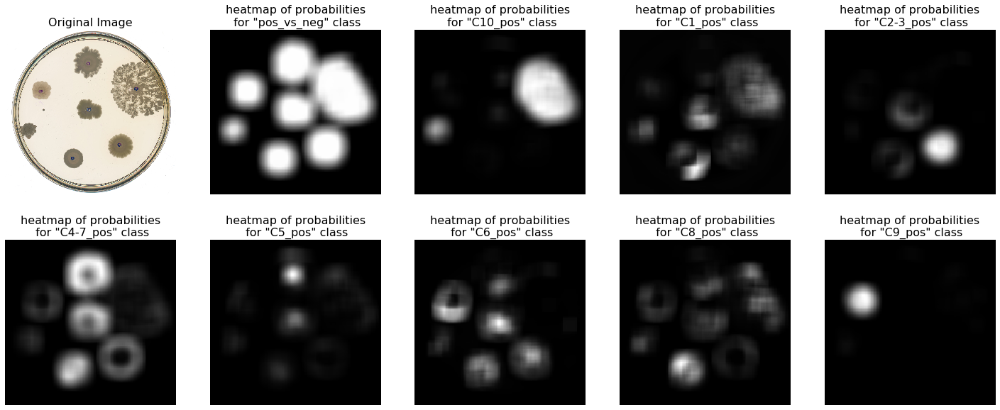

In [51]:
class_dict = {0: "C10_pos",
              1 :"C1_pos",
              2: "C2-3_pos",
              3: "C4-7_pos",
              4: "C5_pos",
              5: "C6_pos",
              6: "C8_pos",
              7: "C9_pos",
              8: "pos_vs_neg"}

patch_size = (128,128)
stride = (8,8)
root_path = 'test_images/mixed_colony_images_nogt/'

try:
    img_paths_dest = 'gdrive/My Drive/Capstone/img_paths_{}_{}.pkl'.format(stride[0],stride[1]) # change 'Capstone', to your own folder in GoogleDrive
    masks_dest = 'gdrive/My Drive/Capstone/heatmaps_{}_{}.pkl'.format(stride[0],stride[1]) # change 'Capstone', to your own folder in GoogleDrive
    img_paths = pickle.load(open(img_paths_dest, 'rb'))
    masks = np.load(masks_dest, allow_pickle=True)
except:
    pass

i = 12
mask = masks[i]
img = cv.imread(img_paths[i])

print('Visualizing heatmaps for "{}":\n'.format(img_paths[i][len(root_path):]))

plt.figure(figsize=(25,10))
plt.rcParams["axes.grid"] = False
plt.subplot(2,5,1),plt.imshow(img[:, :, [2, 1, 0]]) # From BGR to RGB
plt.axis('off')
plt.title('Original Image', fontsize=16)

desired_order = [8,0,1,2,3,4,5,6,7]

for i, chn in enumerate(desired_order):
    class_mask = mask[:,:,chn].astype('uint8') # each channel store each class probabilities
    plt.subplot(2,5,i+2),plt.imshow(class_mask,'gray')
    plt.axis('off')
    plt.title('heatmap of probabilities\n for "{}" class'.format(class_dict[chn]), fontsize=16)

plt.show()

### **Let's now visualize the heatmaps for the 'negative'/'positive' class prediction for "all" test images:**


visualizing "positive vs negative" heatmap for "Mixed-colony_21_052.jpg"...


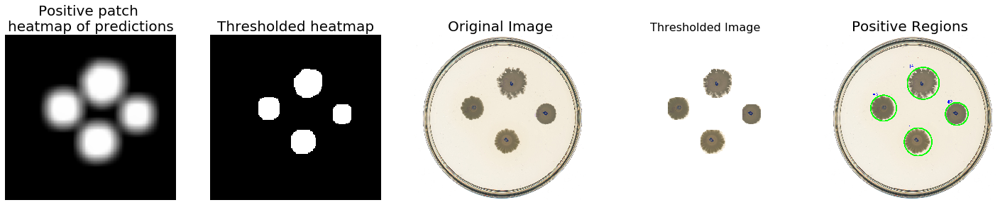


visualizing "positive vs negative" heatmap for "Mixed-colony_25_056.jpg"...


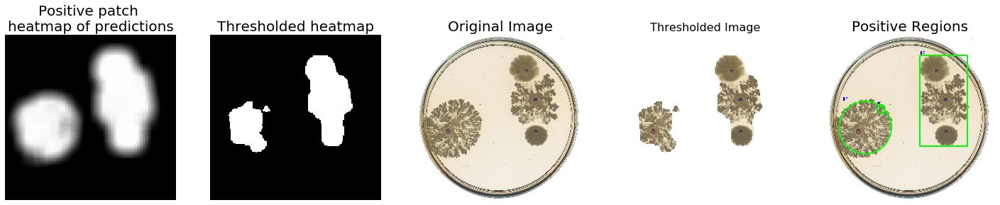


visualizing "positive vs negative" heatmap for "Mixed-colony_16_037.jpg"...


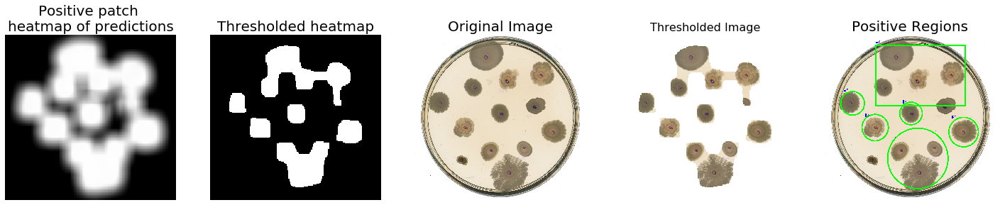


visualizing "positive vs negative" heatmap for "Mixed-colony_24_058.jpg"...


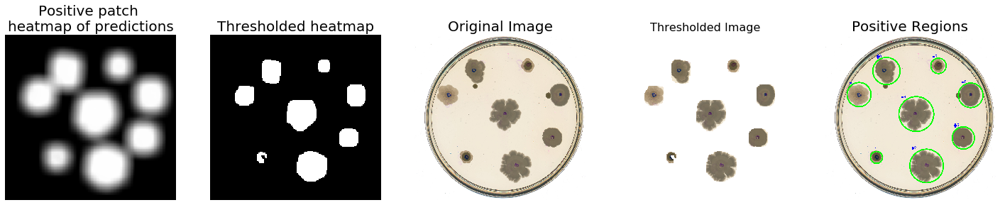


visualizing "positive vs negative" heatmap for "Mixed-colony_07_036.jpg"...


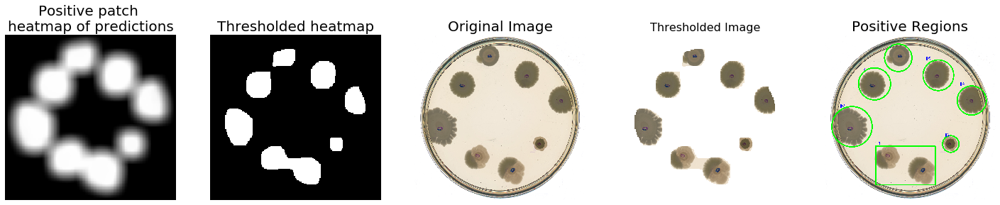


visualizing "positive vs negative" heatmap for "Mixed-colony_11_062.jpg"...


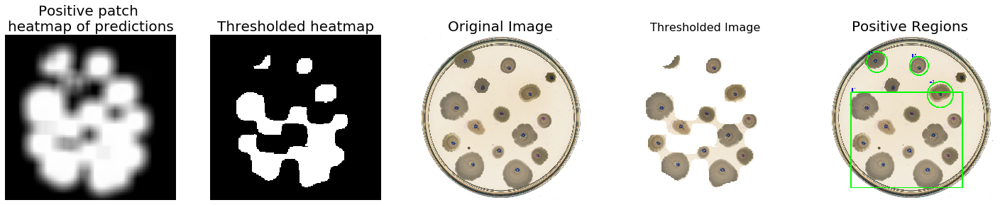


visualizing "positive vs negative" heatmap for "Mixed-colony_10_045.jpg"...


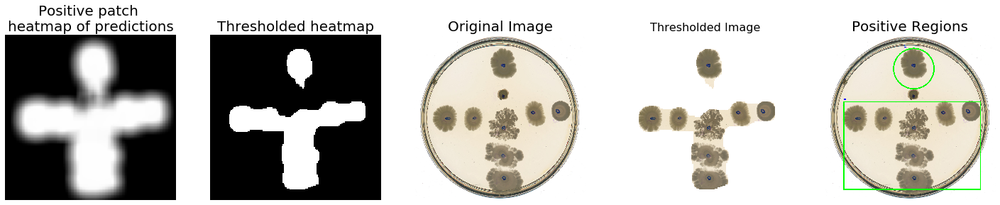


visualizing "positive vs negative" heatmap for "Mixed-colony_05_055.jpg"...


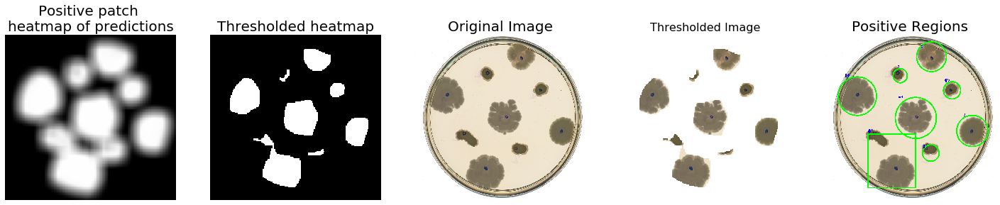


visualizing "positive vs negative" heatmap for "Mixed-colony_23_063.jpg"...


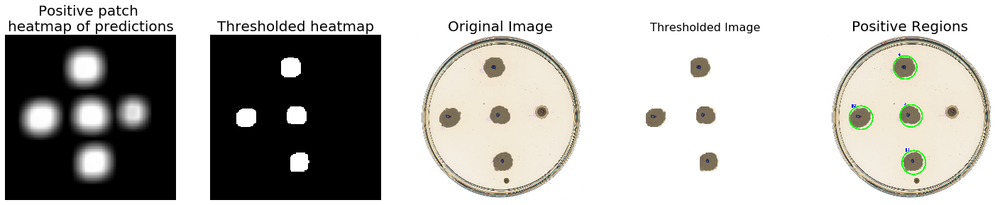


visualizing "positive vs negative" heatmap for "Mixed-colony_04_040.jpg"...


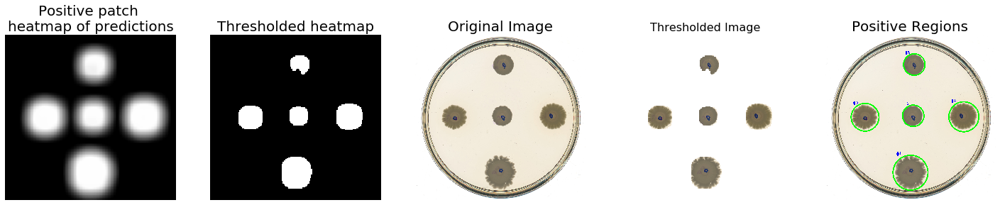


visualizing "positive vs negative" heatmap for "Mixed-colony_08_051.jpg"...


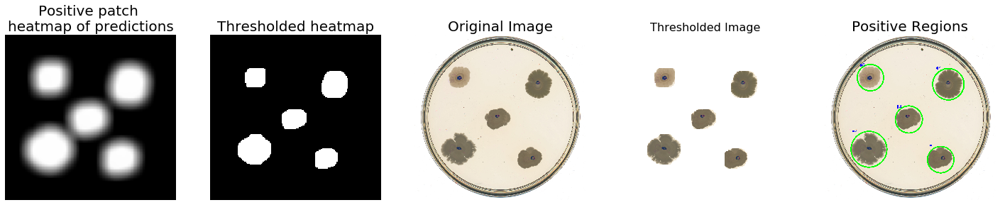


visualizing "positive vs negative" heatmap for "Mixed-colony_18_064.jpg"...


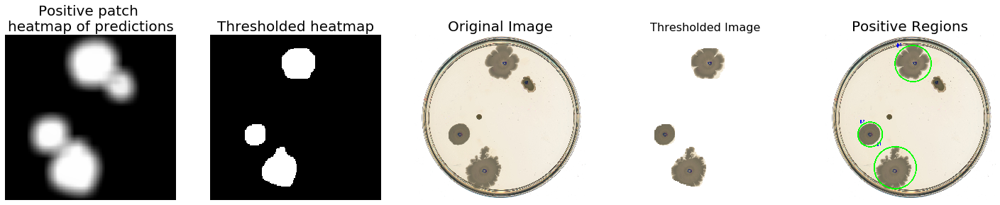


visualizing "positive vs negative" heatmap for "Mixed-colony_14_042.jpg"...


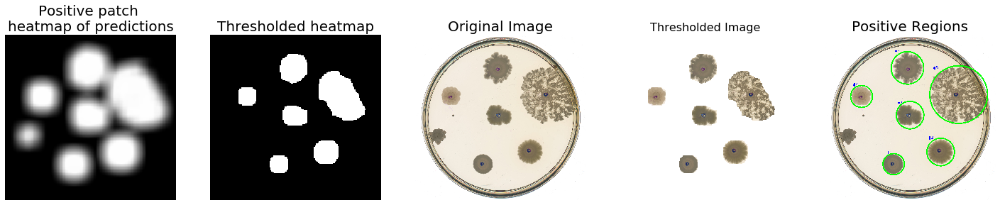


visualizing "positive vs negative" heatmap for "Mixed-colony_22_053.jpg"...


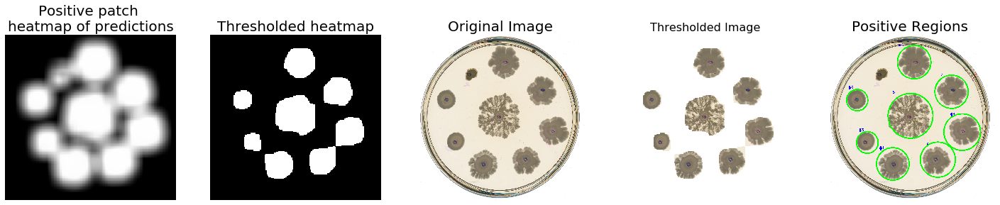


visualizing "positive vs negative" heatmap for "Mixed-colony_19_061.jpg"...


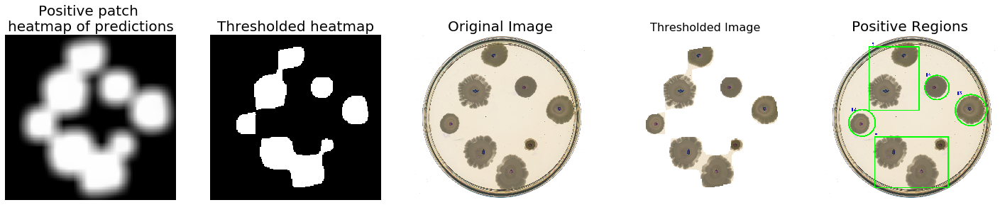


visualizing "positive vs negative" heatmap for "Mixed-colony_15_039.jpg"...


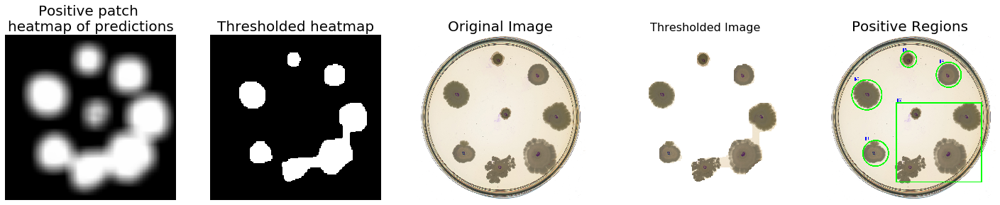


visualizing "positive vs negative" heatmap for "Mixed-colony_28_057.jpg"...


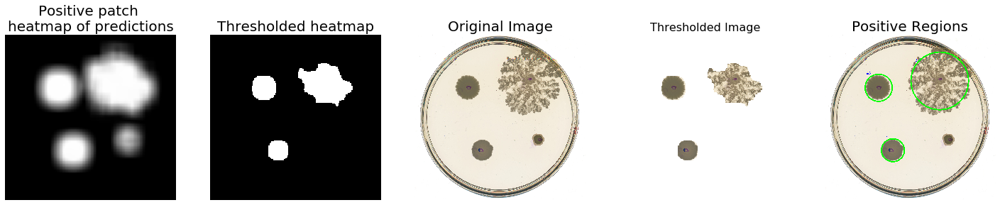


visualizing "positive vs negative" heatmap for "Mixed-colony_20_049.jpg"...


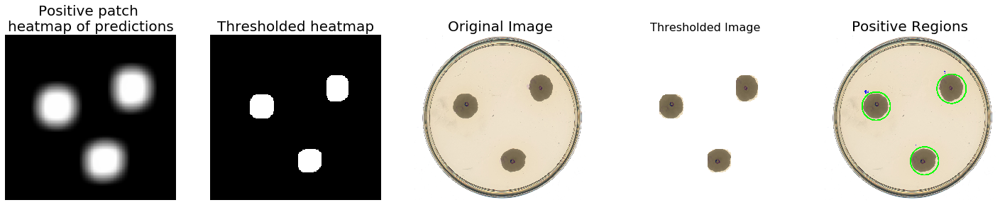


visualizing "positive vs negative" heatmap for "Mixed-colony_01_043.jpg"...


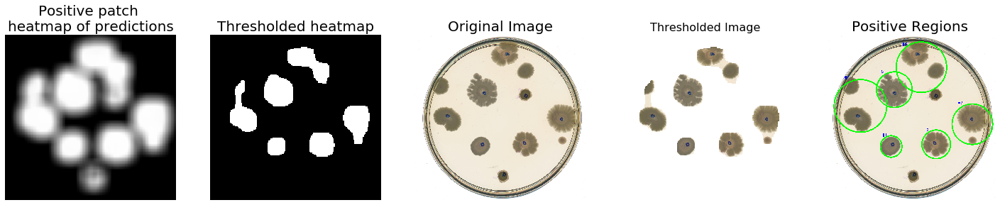


visualizing "positive vs negative" heatmap for "Mixed-colony_29_048.jpg"...


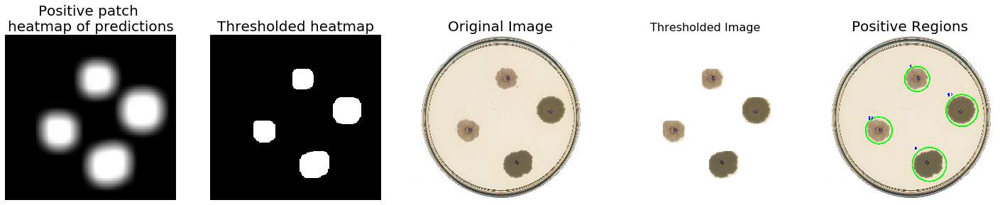


visualizing "positive vs negative" heatmap for "Mixed-colony_09_044.jpg"...


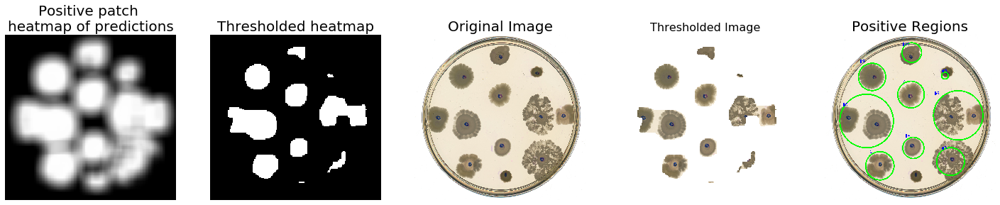


visualizing "positive vs negative" heatmap for "Mixed-colony_02_046.jpg"...


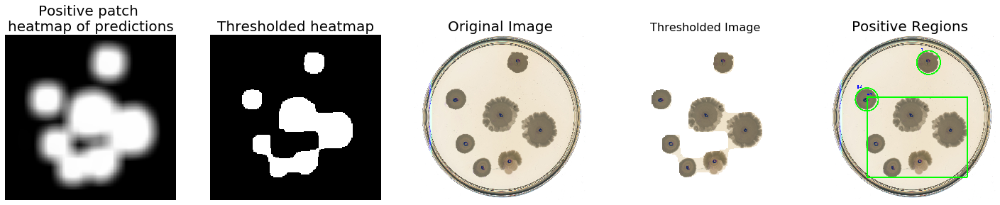


visualizing "positive vs negative" heatmap for "Mixed-colony_17_065.jpg"...


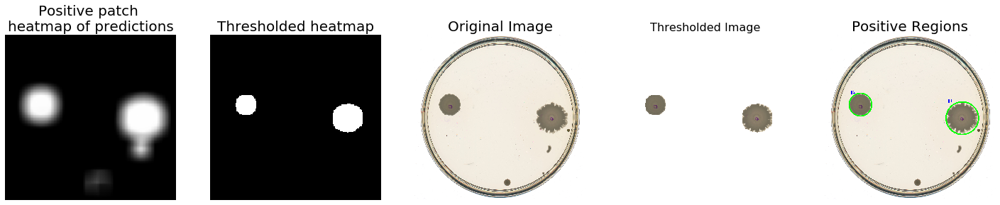


visualizing "positive vs negative" heatmap for "Mixed-colony_27_050.jpg"...


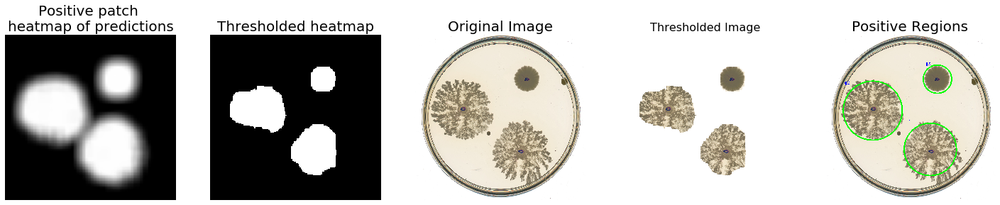


visualizing "positive vs negative" heatmap for "Mixed-colony_12_041.jpg"...


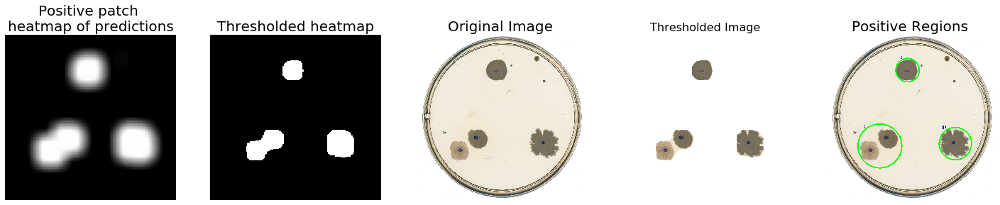


visualizing "positive vs negative" heatmap for "Mixed-colony_30_060.jpg"...


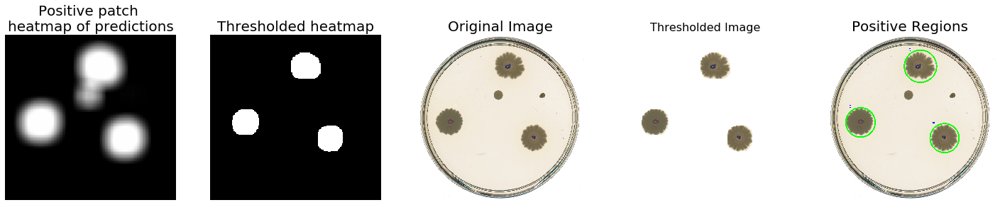


visualizing "positive vs negative" heatmap for "Mixed-colony_13_047.jpg"...


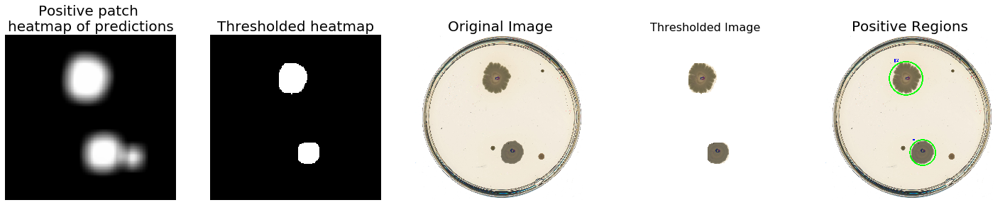


visualizing "positive vs negative" heatmap for "Mixed-colony_06_054.jpg"...


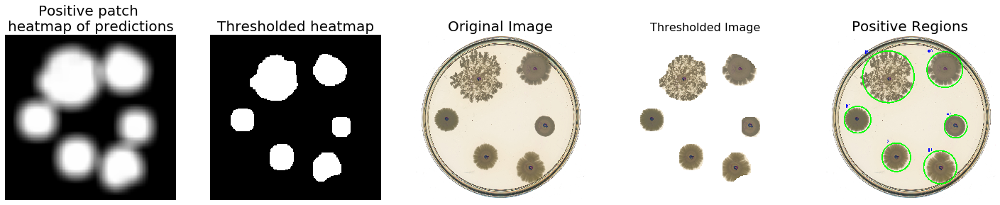


visualizing "positive vs negative" heatmap for "Mixed-colony_03_038.jpg"...


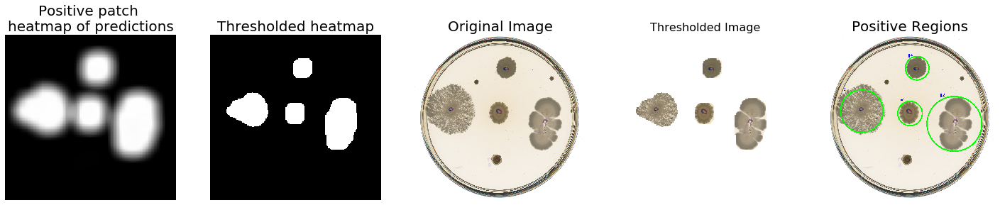


visualizing "positive vs negative" heatmap for "Mixed-colony_26_059.jpg"...


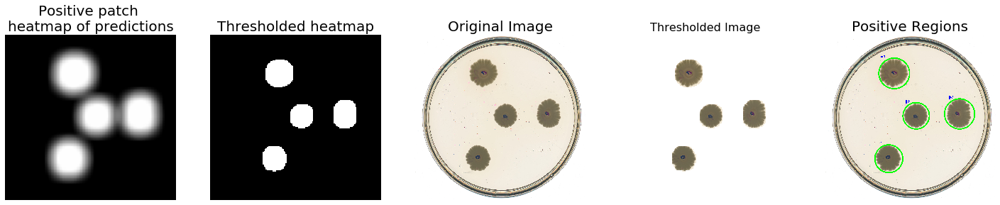

In [49]:
patch_size = (128,128)
stride = (8,8)
root_path = 'test_images/mixed_colony_images_nogt/'

try:
    img_paths_dest = 'gdrive/My Drive/Capstone/img_paths_{}_{}.pkl'.format(stride[0],stride[1]) # change 'Capstone', to your own folder in GoogleDrive
    masks_dest = 'gdrive/My Drive/Capstone/heatmaps_{}_{}.pkl'.format(stride[0],stride[1]) # change 'Capstone', to your own folder in GoogleDrive
    img_paths = pickle.load(open(img_paths_dest, 'rb'))
    masks = np.load(masks_dest, allow_pickle=True)
except:
    pass

for i, img_path in enumerate(img_paths):
    print('\nvisualizing "positive vs negative" heatmap for "{}"...'.format(img_path[len(root_path):]))
    #img = Image.open(img_path)
    img = cv.imread(img_path)
    img_copy = img.copy()
    mask = masks[i][:,:,8].astype('uint8') # channel 8 stores 'pos_vs_neg' probabilities

    plt.figure(figsize=(25,125))
    plt.rcParams["axes.grid"] = False

    plt.subplot(1,5,1),plt.imshow(mask,'gray')
    plt.axis('off')
    plt.title('Positive patch \nheatmap of predictions', fontsize=20)

    ret,thresh = cv.threshold(mask,240,255,cv.THRESH_BINARY) 
    plt.subplot(1,5,2),plt.imshow(thresh,'gray')
    plt.axis('off')
    plt.title('Thresholded heatmap', fontsize=20)

    plt.subplot(1,5,3),plt.imshow(img[:, :, [2, 1, 0]]) # From BGR to RGB
    plt.axis('off')
    plt.title('Original Image', fontsize=20)

    thresh = thresh.astype(int)
    img_copy[thresh==0] = 255 # set all pixels outside the mask, to white color
    plt.subplot(1,5,4),plt.imshow(img_copy[:, :, [2, 1, 0]]) # From BGR to RGB
    plt.axis('off')
    plt.title('Thresholded Image', fontsize=16)

    thresh = thresh.astype('uint8')
    contours, _ = cv.findContours(thresh.copy(), cv.RETR_EXTERNAL,
                            cv.CHAIN_APPROX_SIMPLE)    
    for (i, c) in enumerate(contours):
        if cv.contourArea(c) >= 1000:
            (x, y, w, h) = cv.boundingRect(c)
            ((cX, cY), radius) = cv.minEnclosingCircle(c)
            if radius <= 262:
                cv.circle(img, (int(cX), int(cY)), int(radius), (0,255,0), 10)
            else:
                cv.rectangle(img,(x,y),(x+w,y+h),(0,255,0),10)
            cv.putText(img, "#{}".format(i + 1), (x, y - 15),
                       cv.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)
    plt.subplot(1,5,5),plt.imshow(img[:, :, [2, 1, 0]]) # From BGR to RGB
    plt.axis('off')
    plt.title('Positive Regions', fontsize=20)

    plt.show()

### **Let's now visualize the heatmaps for the 'C10' class prediction for "all" test images:**


visualizing "C10" heatmap for "Mixed-colony_21_"...


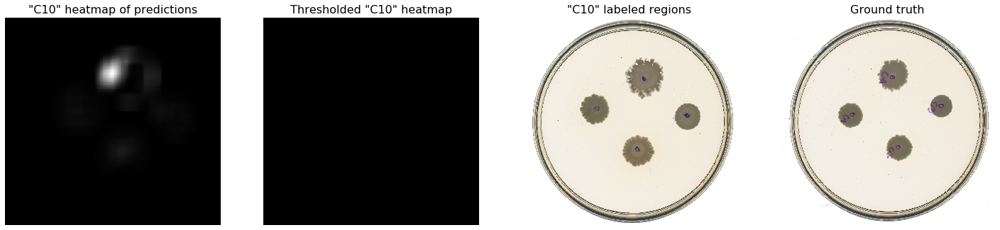


visualizing "C10" heatmap for "Mixed-colony_25_"...


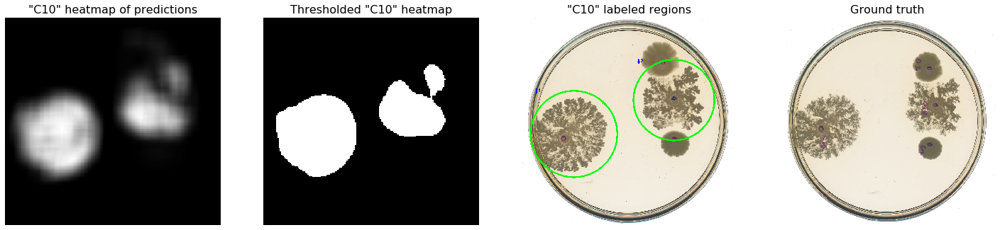


visualizing "C10" heatmap for "Mixed-colony_16_"...


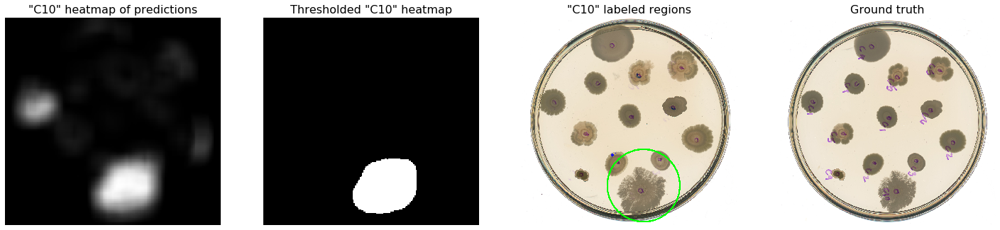


visualizing "C10" heatmap for "Mixed-colony_24_"...


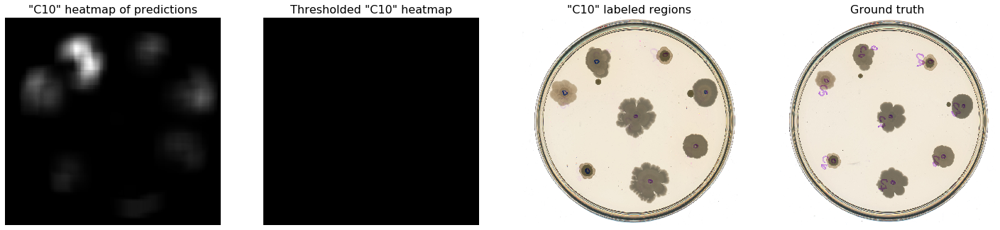


visualizing "C10" heatmap for "Mixed-colony_07_"...


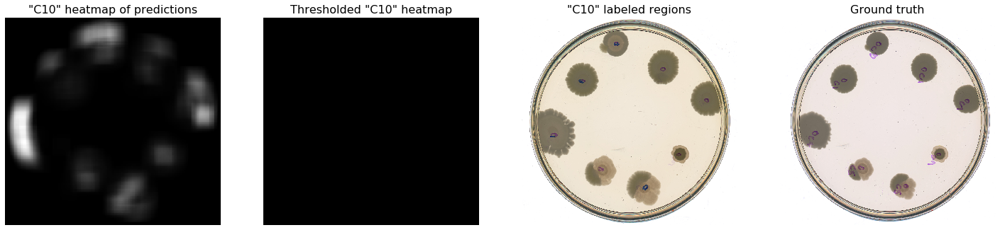


visualizing "C10" heatmap for "Mixed-colony_11_"...


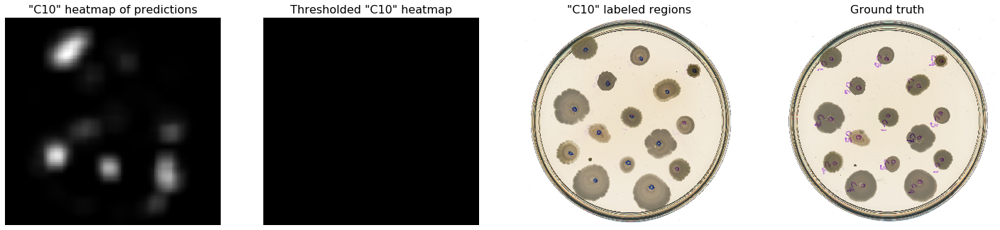


visualizing "C10" heatmap for "Mixed-colony_10_"...


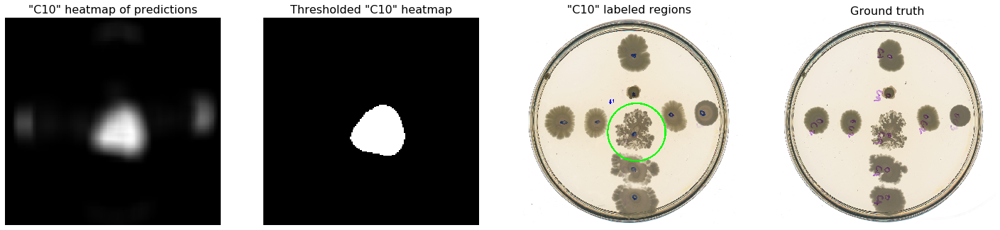


visualizing "C10" heatmap for "Mixed-colony_05_"...


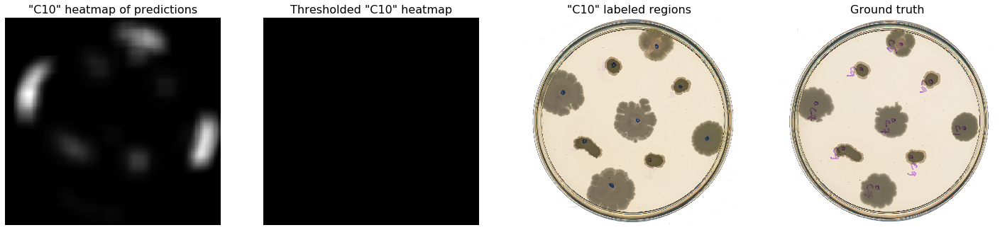


visualizing "C10" heatmap for "Mixed-colony_23_"...


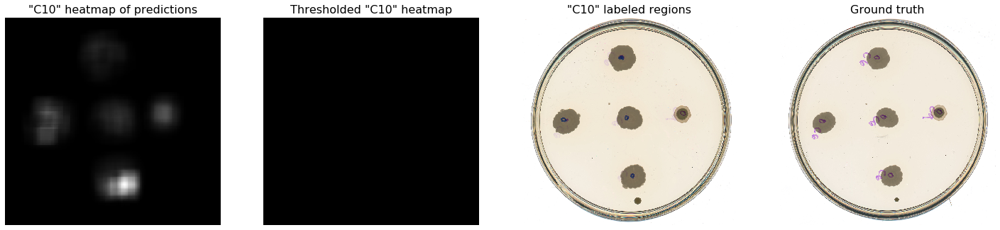


visualizing "C10" heatmap for "Mixed-colony_04_"...


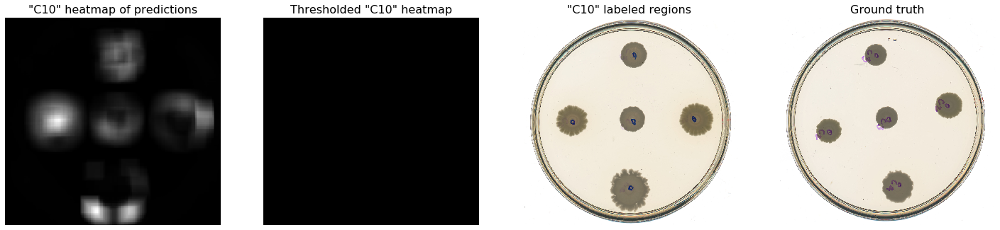


visualizing "C10" heatmap for "Mixed-colony_08_"...


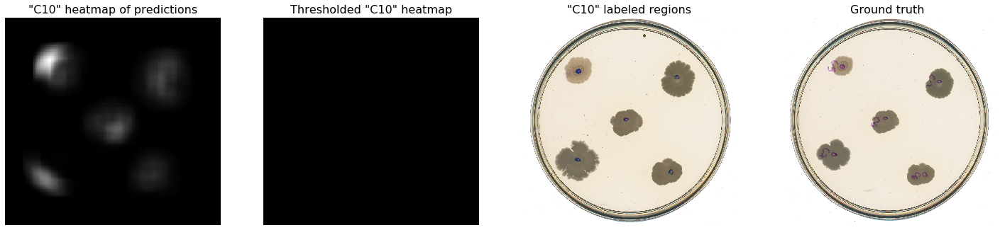


visualizing "C10" heatmap for "Mixed-colony_18_"...


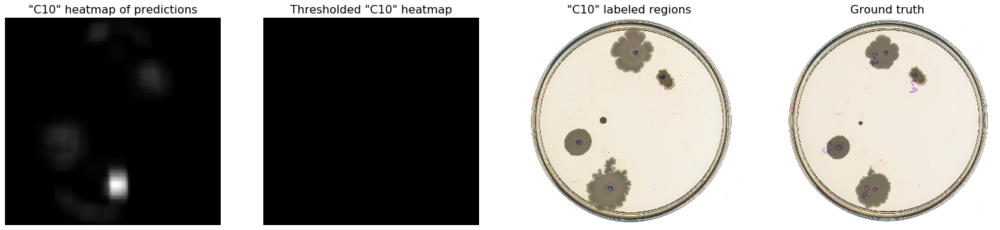


visualizing "C10" heatmap for "Mixed-colony_14_"...


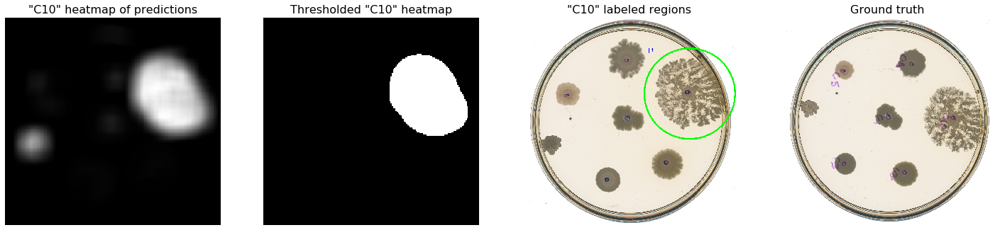


visualizing "C10" heatmap for "Mixed-colony_22_"...


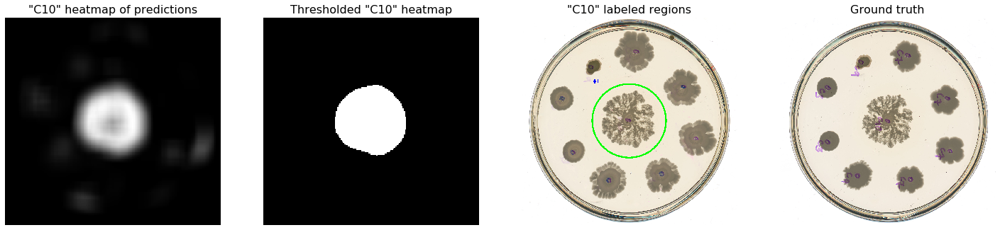


visualizing "C10" heatmap for "Mixed-colony_19_"...


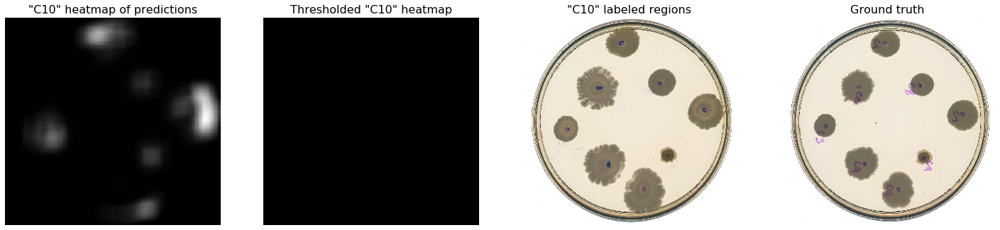


visualizing "C10" heatmap for "Mixed-colony_15_"...


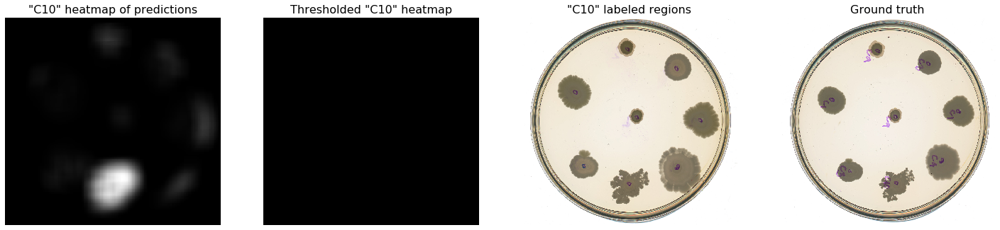


visualizing "C10" heatmap for "Mixed-colony_28_"...


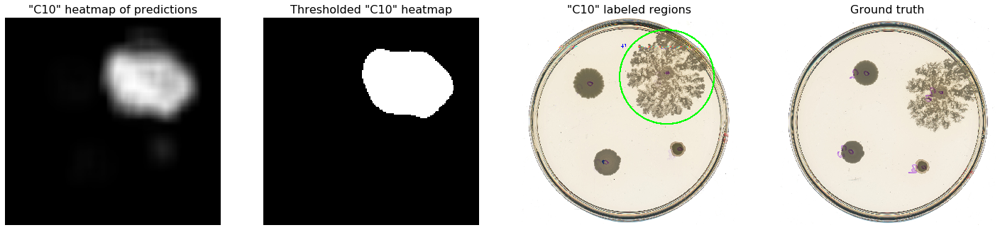


visualizing "C10" heatmap for "Mixed-colony_20_"...


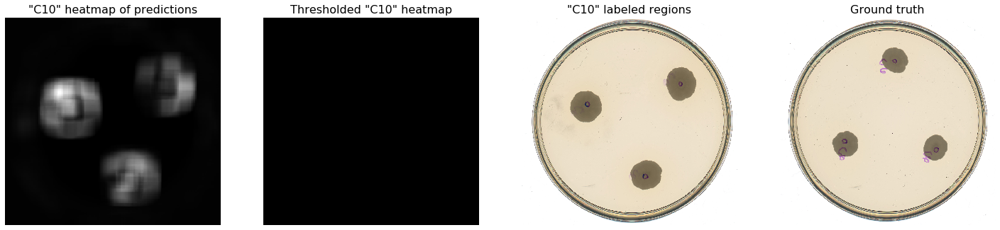


visualizing "C10" heatmap for "Mixed-colony_01_"...


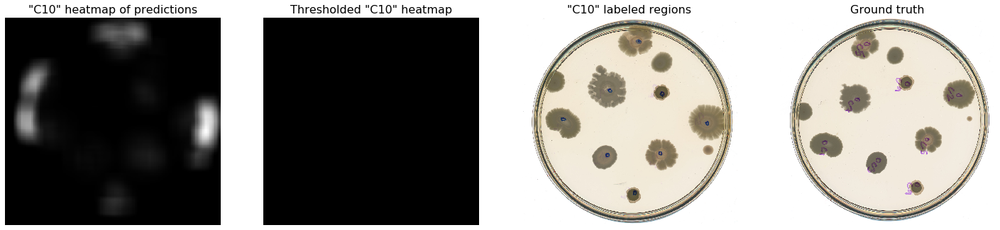


visualizing "C10" heatmap for "Mixed-colony_29_"...


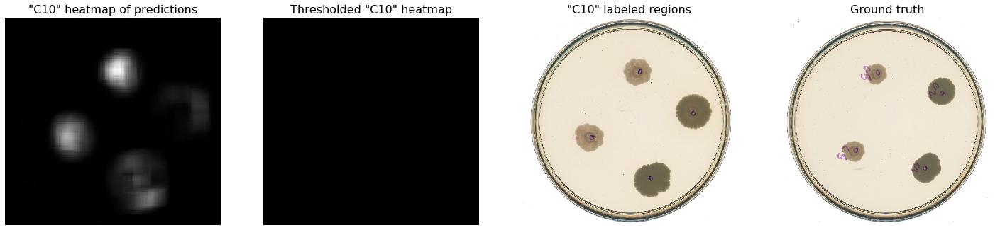


visualizing "C10" heatmap for "Mixed-colony_09_"...


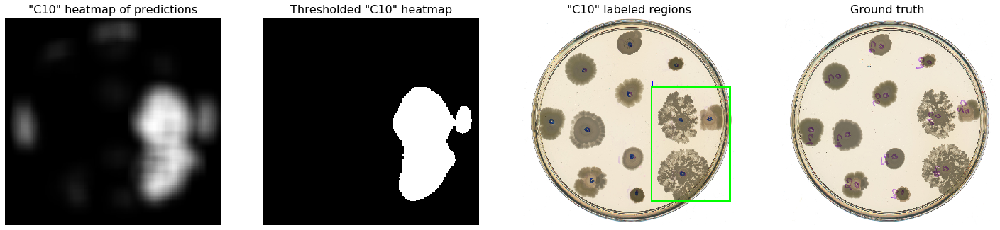


visualizing "C10" heatmap for "Mixed-colony_02_"...


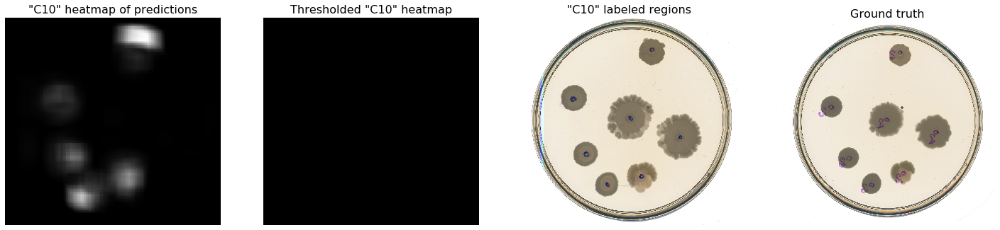


visualizing "C10" heatmap for "Mixed-colony_17_"...


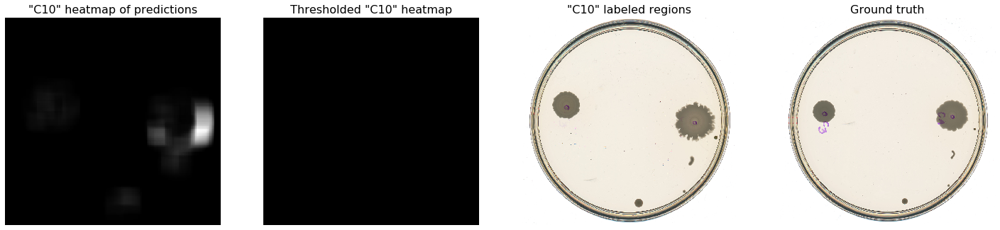


visualizing "C10" heatmap for "Mixed-colony_27_"...


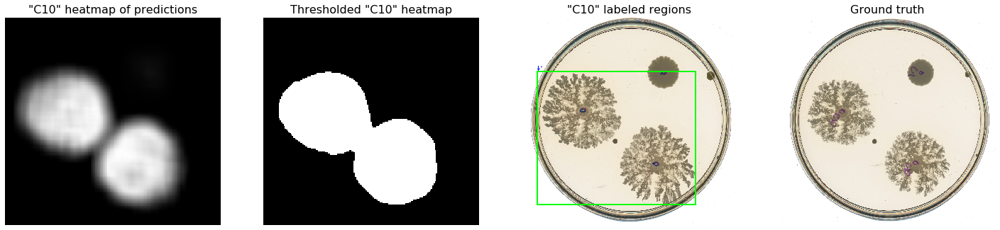


visualizing "C10" heatmap for "Mixed-colony_12_"...


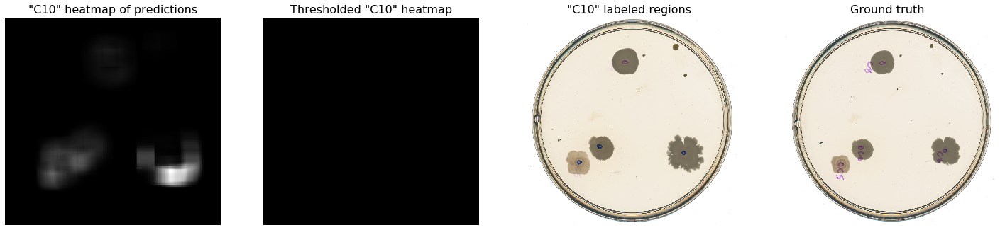


visualizing "C10" heatmap for "Mixed-colony_30_"...


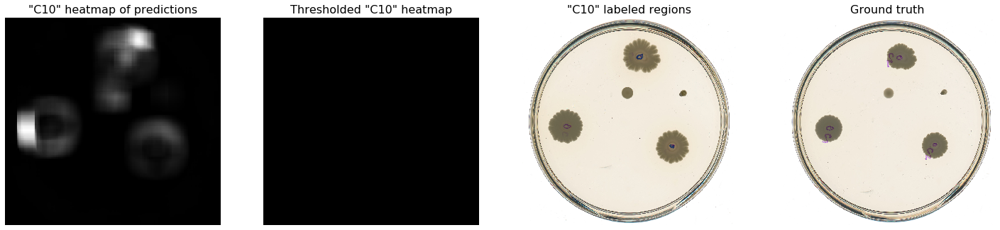


visualizing "C10" heatmap for "Mixed-colony_13_"...


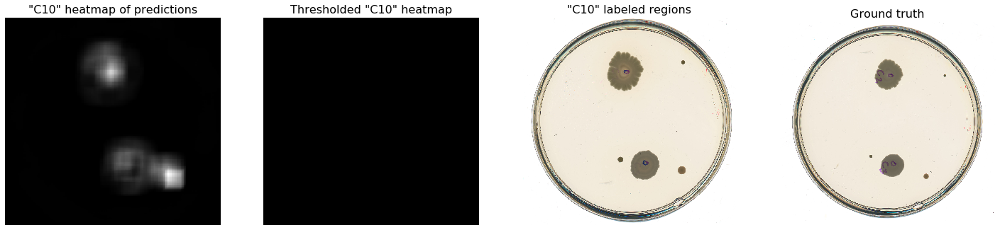


visualizing "C10" heatmap for "Mixed-colony_06_"...


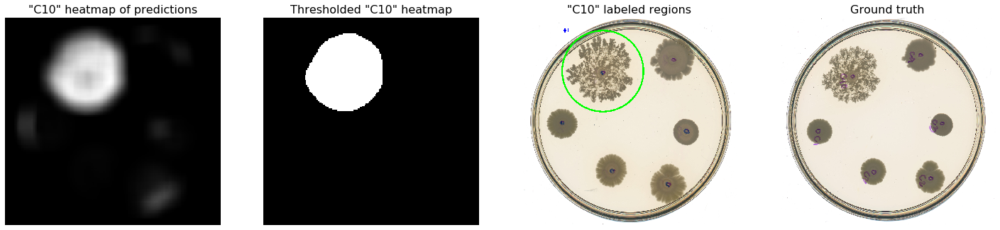


visualizing "C10" heatmap for "Mixed-colony_03_"...


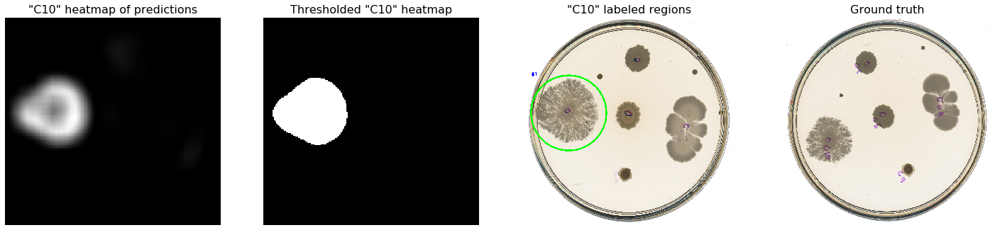


visualizing "C10" heatmap for "Mixed-colony_26_"...


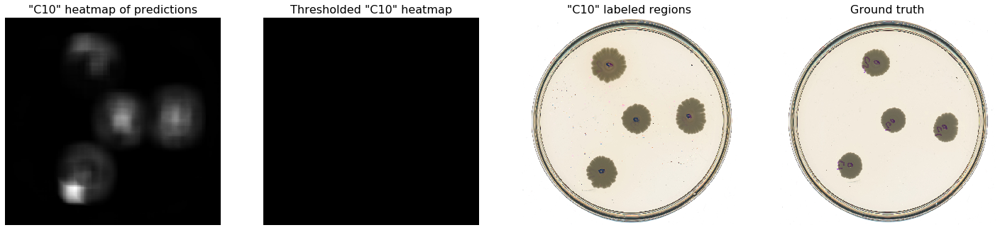

In [50]:
patch_size = (128,128)
stride = (8,8)
root_path = 'test_images/mixed_colony_images_nogt/'
gt_root_path = 'test_images/mixed_colony_images_gt/'

try:
    img_paths_dest = 'gdrive/My Drive/Capstone/img_paths_{}_{}.pkl'.format(stride[0],stride[1]) # change 'Capstone', to your own folder in GoogleDrive
    masks_dest = 'gdrive/My Drive/Capstone/heatmaps_{}_{}.pkl'.format(stride[0],stride[1]) # change 'Capstone', to your own folder in GoogleDrive
    img_paths = pickle.load(open(img_paths_dest, 'rb'))
    masks = np.load(masks_dest, allow_pickle=True)
except:
    pass

for i, img_path in enumerate(img_paths):
    img_name = img_path[len(root_path):len(root_path)+16]
    print('\nvisualizing "C10" heatmap for "{}"...'.format(img_name))
    img = cv.imread(img_path)
    for gt_img_name in os.listdir(gt_root_path):
        if img_name in gt_img_name: gt_img_path = gt_root_path + gt_img_name 
    gt_img = cv.imread(gt_img_path)
    mask = masks[i][:,:,0].astype('uint8') # channel 0 stores 'C10' probabilities

    plt.figure(figsize=(25,125))
    plt.rcParams["axes.grid"] = False

    plt.subplot(1,4,1),plt.imshow(mask,'gray')
    plt.axis('off')
    plt.title('"C10" heatmap of predictions', fontsize=16)

    ret,thresh = cv.threshold(mask,75,255,cv.THRESH_BINARY)
    contours, _ = cv.findContours(thresh.copy(), cv.RETR_EXTERNAL,
                            cv.CHAIN_APPROX_SIMPLE)
    new_mask = np.zeros(img.shape, dtype="uint8") # initiates new 'black' mask
    large_contours = []
    for (i, c) in enumerate(contours):
        if cv.contourArea(c) >= 85000:
            large_contours.append(c)
    cv.drawContours(new_mask, large_contours, -1, (255,255,255), -1)
    plt.subplot(1,4,2),plt.imshow(new_mask,'gray')
    plt.axis('off')
    plt.title('Thresholded "C10" heatmap', fontsize=16)
  
    for (i, c) in enumerate(large_contours):
        #print(cv.contourArea(c))
        (x, y, w, h) = cv.boundingRect(c)
        ((cX, cY), radius) = cv.minEnclosingCircle(c)
        #print(radius)
        if radius <= 350:
            cv.circle(img, (int(cX), int(cY)), int(radius), (0,255,0), 10)
        else:
            cv.rectangle(img,(x,y),(x+w,y+h),(0,255,0),10)
        cv.putText(img, "#{}".format(i + 1), (x, y - 15),
                   cv.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)
    plt.subplot(1,4,3),plt.imshow(img[:, :, [2, 1, 0]]) # From BGR to RGB
    plt.axis('off')
    plt.title('"C10" labeled regions', fontsize=16)

    plt.subplot(1,4,4),plt.imshow(gt_img[:, :, [2, 1, 0]]) # From BGR to RGB
    plt.axis('off')
    plt.title('Ground truth', fontsize=16)

    plt.show()

# **Next and final steps:**

#### **Use the probability heatmaps, to find the predicted probabilities for any region of any size within the test images.**

